<a href="https://colab.research.google.com/github/pratikpathe/Image-restoration/blob/main/Group_10_IMAGE_RESTORATION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Import Libraires

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-07ec59e3-1c48-e7cc-eb07-26d98e6a7dfe)


In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

'/device:GPU:0'

In [ ]:
!nvcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0


In [ ]:
# Specify the path of the ZIP file you want to unzip
zip_path = "/content/drive/MyDrive/IRDATA/Data/ImageRestoration.zip"

# Specify the path where you want to extract the contents of the ZIP file
extract_path = "/content/drive/MyDrive/IRDATA/Data/DATA"

# Unzip the file
#!unzip -q $zip_path -d $extract_path

In [ ]:
import numpy as np
import keras
import cv2
from keras.models import
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

# Load Data

In [ ]:
# to get the files in proper order
def sorted_alphanumeric(data):
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
# defining the size of the image
SIZE = 256
high_img = []
path = '/content/drive/MyDrive/IRDATA/Data/DATA/HQLQDataset/HQ'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '891.png':
        break
    else:
        img = cv2.imread(path + '/'+i,1)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        high_img.append(img_to_array(img))


low_img = []
path = '/content/drive/MyDrive/IRDATA/Data/DATA/HQLQDataset/LQ'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
     if i == '891.png':
        break
     else:
        img = cv2.imread(path + '/'+i,1)

        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        #resizing image
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        low_img.append(img_to_array(img))

100%|██████████| 890/890 [00:15<00:00, 58.77it/s] 


# Data Visualization

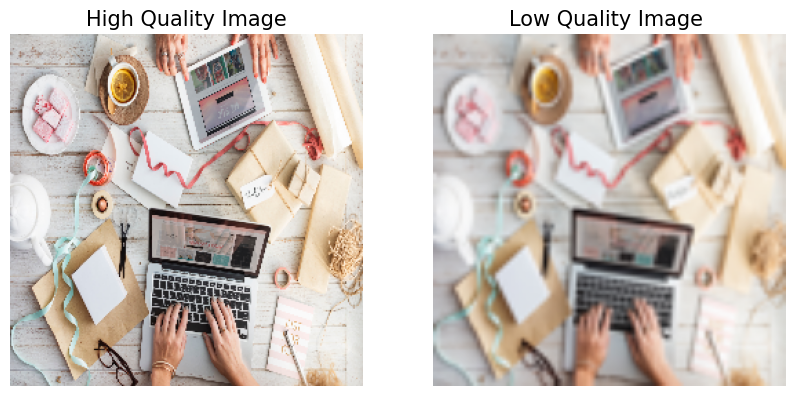

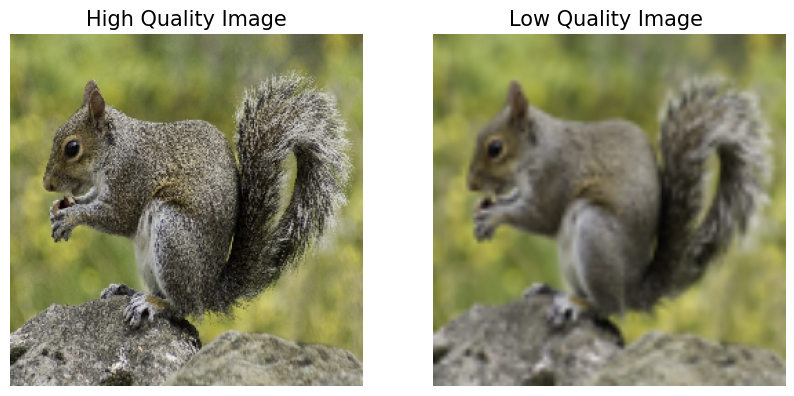

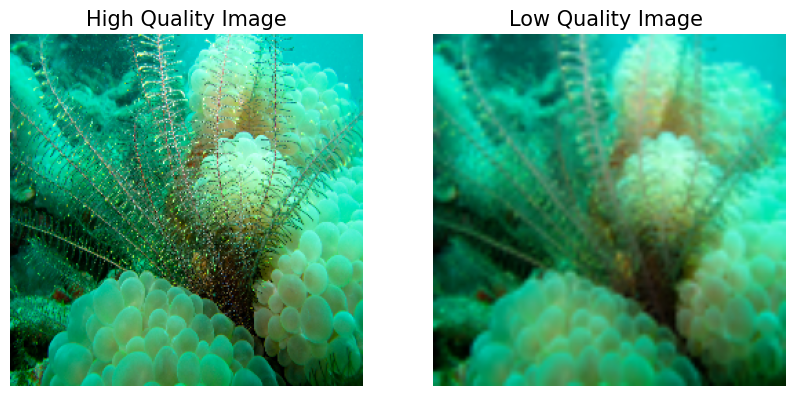

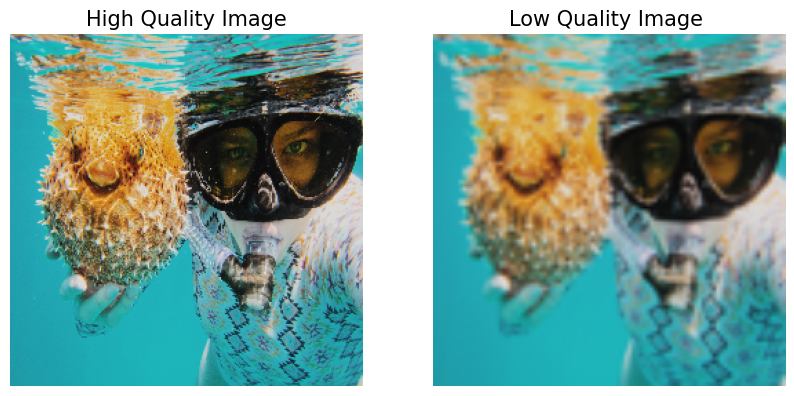

In [ ]:
for i in range(4):
    a = np.random.randint(0,855)
    plt.figure(figsize=(10,10))
    plt.subplot(1,2,1)
    plt.title('High Quality Image', color = 'black', fontsize = 15)
    plt.imshow(high_img[a])
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.title('Low Quality Image ', color = 'black', fontsize = 15)
    plt.imshow(low_img[a])
    plt.axis('off')

# Slicing and Reshaping Images

In [ ]:
train_high_image = high_img[:700]
train_low_image = low_img[:700]
train_high_image = np.reshape(train_high_image,(len(train_high_image),SIZE,SIZE,3))
train_low_image = np.reshape(train_low_image,(len(train_low_image),SIZE,SIZE,3))

validation_high_image = high_img[700:830]
validation_low_image = low_img[700:830]
validation_high_image= np.reshape(validation_high_image,(len(validation_high_image),SIZE,SIZE,3))
validation_low_image = np.reshape(validation_low_image,(len(validation_low_image),SIZE,SIZE,3))


test_high_image = high_img[830:]
test_low_image = low_img[830:]
test_high_image= np.reshape(test_high_image,(len(test_high_image),SIZE,SIZE,3))
test_low_image = np.reshape(test_low_image,(len(test_low_image),SIZE,SIZE,3))

print("Shape of training images:",train_high_image.shape)
print("Shape of test images:",test_high_image.shape)
print("Shape of validation images:",validation_high_image.shape)


Shape of training images: (700, 256, 256, 3)
Shape of test images: (60, 256, 256, 3)
Shape of validation images: (130, 256, 256, 3)


# Defining Model

In [ ]:
#OLD MODEL

# from keras import layers
# def down(filters , kernel_size, apply_batch_normalization = True):
#     downsample = tf.keras.models.Sequential()
#     downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
#     if apply_batch_normalization:
#         downsample.add(layers.BatchNormalization())
#     downsample.add(keras.layers.LeakyReLU())
#     return downsample


# def up(filters, kernel_size, dropout = False):
#     upsample = tf.keras.models.Sequential()
#     upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
#     if dropout:
#         upsample.dropout(0.2)
#     upsample.add(keras.layers.LeakyReLU())
#     return upsample

# def model():
#     inputs = layers.Input(shape= [SIZE,SIZE,3])
#     d1 = down(128,(3,3),False)(inputs)
#     d2 = down(128,(3,3),False)(d1)
#     d3 = down(256,(3,3),True)(d2)
#     d4 = down(512,(3,3),True)(d3)
#     d5 = down(512,(3,3),True)(d4)
#     #upsampling
#     u1 = up(512,(3,3),False)(d5)
#     u1 = layers.concatenate([u1,d4])
#     u2 = up(256,(3,3),False)(u1)
#     u2 = layers.concatenate([u2,d3])
#     u3 = up(128,(3,3),False)(u2)
#     u3 = layers.concatenate([u3,d2])
#     u4 = up(128,(3,3),False)(u3)
#     u4 = layers.concatenate([u4,d1])
#     u5 = up(3,(3,3),False)(u4)
#     u5 = layers.concatenate([u5,inputs])
#     output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u5)
#     return tf.keras.Model(inputs=inputs, outputs=output)

# model = model()
# model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  147584      ['sequential[0][0]']             
                                                                                              

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers

def down(filters , kernel_size, apply_batch_normalization=True):
    downsample = tf.keras.Sequential()
    downsample.add(layers.Conv2D(filters, kernel_size, padding='same', strides=2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(layers.LeakyReLU())
    return downsample

def up(filters, kernel_size, dropout=False):
    upsample = tf.keras.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size, padding='same', strides=2))
    if dropout:
        upsample.add(layers.Dropout(0.2))
    upsample.add(layers.LeakyReLU())
    return upsample

def build_model(input_shape=(256, 256, 3)):
    inputs = layers.Input(shape=input_shape)
    d1 = down(128, (3,3), False)(inputs)
    d2 = down(128, (3,3), False)(d1)
    d3 = down(256, (3,3), True)(d2)
    d4 = down(512, (3,3), True)(d3)
    d5 = down(512, (3,3), True)(d4)
    # upsampling
    u1 = up(512, (3,3), False)(d5)
    u1 = layers.concatenate([u1,d4])
    u2 = up(256, (3,3), False)(u1)
    u2 = layers.concatenate([u2,d3])
    u3 = up(128, (3,3), False)(u2)
    u3 = layers.concatenate([u3,d2])
    u4 = up(128, (3,3), False)(u3)
    u4 = layers.concatenate([u4,d1])
    u5 = up(3, (3,3), False)(u4)
    u5 = layers.concatenate([u5,inputs])
    output = layers.Conv2D(3, (2,2), strides=1, padding='same')(u5)
    return tf.keras.Model(inputs=inputs, outputs=output)

model = build_model()
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 128, 128, 12  3584        ['input_1[0][0]']                
                                8)                                                                
                                                                                                  
 sequential_1 (Sequential)      (None, 64, 64, 128)  147584      ['sequential[0][0]']             
                                                                                              

In [ ]:
# APPROCH WITH GAN


# import tensorflow as tf
# from tensorflow.keras import layers

# # Define the generator model
# def generator():
#     inputs = layers.Input(shape=(100,))
#     x = layers.Dense(7*7*256, use_bias=False)(inputs)
#     x = layers.BatchNormalization()(x)
#     x = layers.LeakyReLU()(x)

#     x = layers.Reshape((7, 7, 256))(x)
#     x = layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False)(x)
#     x = layers.BatchNormalization()(x)
#     x = layers.LeakyReLU()(x)

#     x = layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False)(x)
#     x = layers.BatchNormalization()(x)
#     x = layers.LeakyReLU()(x)

#     x = layers.Conv2DTranspose(1, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh')(x)

#     return tf.keras.Model(inputs=inputs, outputs=x)

# # Define the discriminator model
# def discriminator():
#     inputs = layers.Input(shape=(28, 28, 1))
#     x = layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same')(inputs)
#     x = layers.LeakyReLU()(x)
#     x = layers.Dropout(0.3)(x)

#     x = layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same')(x)
#     x = layers.LeakyReLU()(x)
#     x = layers.Dropout(0.3)(x)

#     x = layers.Flatten()(x)
#     x = layers.Dense(1)(x)

#     return tf.keras.Model(inputs=inputs, outputs=x)

# # Define the GAN model
# def make_gan(generator, discriminator):
#     # Freeze the discriminator weights
#     discriminator.trainable = False

#     # Define the GAN model as a sequential model
#     gan = tf.keras.Sequential()

#     # Add the generator and discriminator to the GAN model
#     gan.add(generator)
#     gan.add(discriminator)

#     # Compile the GAN model
#     gan.compile(loss='binary_crossentropy', optimizer='adam')

#     return gan

# # Create instances of the generator and discriminator models
# generator_model = generator()
# discriminator_model = discriminator()

# # Create the GAN model
# gan_model = make_gan(generator_model, discriminator_model)

# # Print the summaries of the models
# generator_model.summary()
# discriminator_model.summary()
# gan_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 100)]             0         
                                                                 
 dense (Dense)               (None, 12544)             1254400   
                                                                 
 batch_normalization (BatchN  (None, 12544)            50176     
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 12544)             0         
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 7, 7, 128)        819200    
 nspose)                                                     

# Compile

In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error',
              metrics = ['acc'])

# Fitting model

In [ ]:
#OLD MODEL

# model.fit(train_low_image, train_high_image, epochs = 50, batch_size = 1,
#           validation_data = (validation_low_image,validation_high_image))

In [ ]:
# Train the model
history = model.fit(train_low_image, train_high_image, epochs=50, batch_size=1,
                    validation_data=(validation_low_image, validation_high_image))

Epoch 1/50
700/700 [==============================] - 33s 22ms/step - loss: 0.0805 - acc: 0.6740 - val_loss: 0.0662 - val_acc: 0.5918
Epoch 2/50
700/700 [==============================] - 14s 20ms/step - loss: 0.0596 - acc: 0.7988 - val_loss: 0.0522 - val_acc: 0.8552
Epoch 3/50
700/700 [==============================] - 14s 21ms/step - loss: 0.0572 - acc: 0.8208 - val_loss: 0.0522 - val_acc: 0.8517
Epoch 4/50
700/700 [==============================] - 15s 22ms/step - loss: 0.0551 - acc: 0.8337 - val_loss: 0.0517 - val_acc: 0.8198
Epoch 5/50
700/700 [==============================] - 15s 22ms/step - loss: 0.0541 - acc: 0.8403 - val_loss: 0.0504 - val_acc: 0.8317
Epoch 6/50
700/700 [==============================] - 15s 21ms/step - loss: 0.0537 - acc: 0.8429 - val_loss: 0.0493 - val_acc: 0.8529
Epoch 7/50
700/700 [==============================] - 15s 22ms/step - loss: 0.0531 - acc: 0.8451 - val_loss: 0.0507 - val_acc: 0.8456
Epoch 8/50
700/700 [==============================] - 15s 21ms

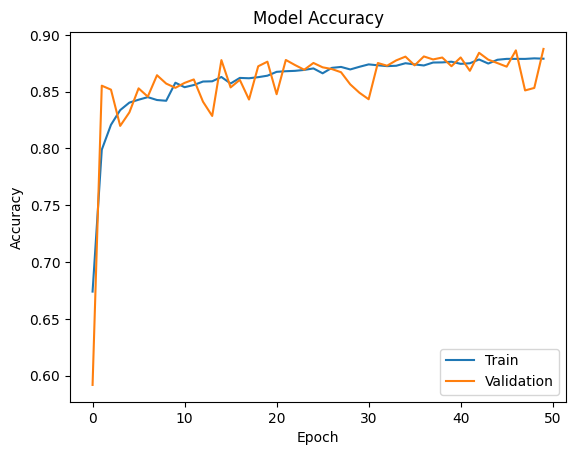

2/2 [==============================] - 0s 113ms/step


<Figure size 1000x800 with 0 Axes>

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot training and validation accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'])
plt.show()

# Evaluate the model on the test dataset
test_loss = model.evaluate(test_low_image, test_high_image)

# Generate predictions for the test dataset
test_predictions = model.predict(test_low_image)
test_predictions = np.argmax(test_predictions, axis=3)
test_true = np.argmax(test_high_image, axis=3)

# Compute confusion matrix
# confusion = confusion_matrix(test_true.flatten(), test_predictions.flatten())

# Plot confusion matrix
plt.figure(figsize=(10, 8))
# sns.heatmap(confusion, annot=True, fmt='d', cmap='Blues')
# plt.title('Confusion Matrix')
# plt.xlabel('Predicted Class')
# plt.ylabel('True Class')
plt.show()

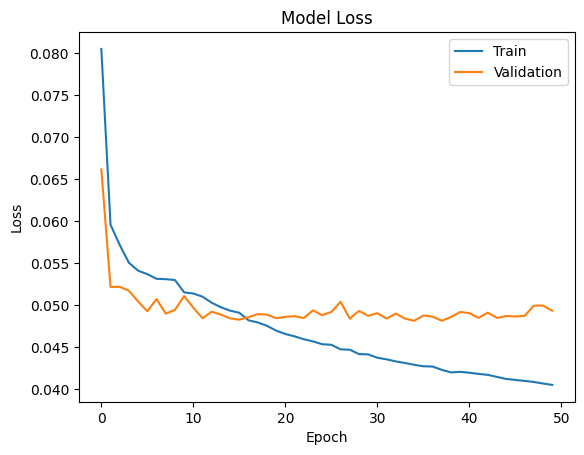

In [ ]:
# Plot training and validation loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Train', 'Validation'])
plt.show()


In [ ]:
import numpy as np

avg_train_acc = np.mean(history.history['acc'])
avg_val_acc = np.mean(history.history['val_acc'])

print('Average training accuracy:', avg_train_acc)
print('Average validation accuracy:', avg_val_acc)


Average training accuracy: 0.8601327037811279
Average validation accuracy: 0.8584532296657562


In [ ]:
test_loss, test_accuracy = model.evaluate(test_low_image, test_high_image)
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)


2/2 [==============================] - 1s 142ms/step - loss: 0.0515 - acc: 0.8768
Test loss: 0.05150920897722244
Test accuracy: 0.8768495917320251


# Prediction Visualization

1/1 [==============================] - 0s 19ms/step


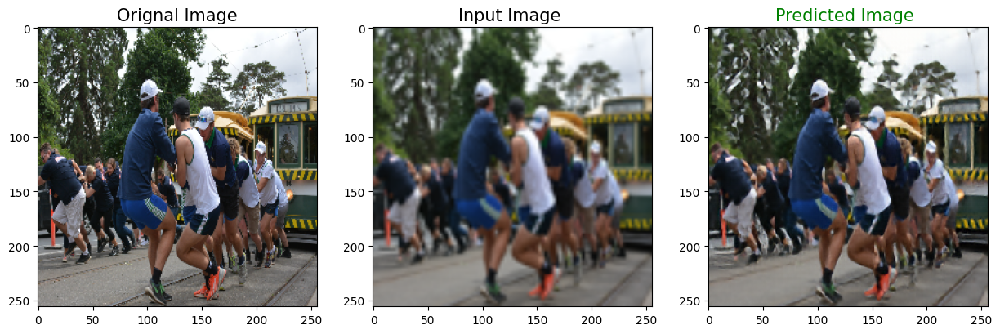

1/1 [==============================] - 0s 31ms/step


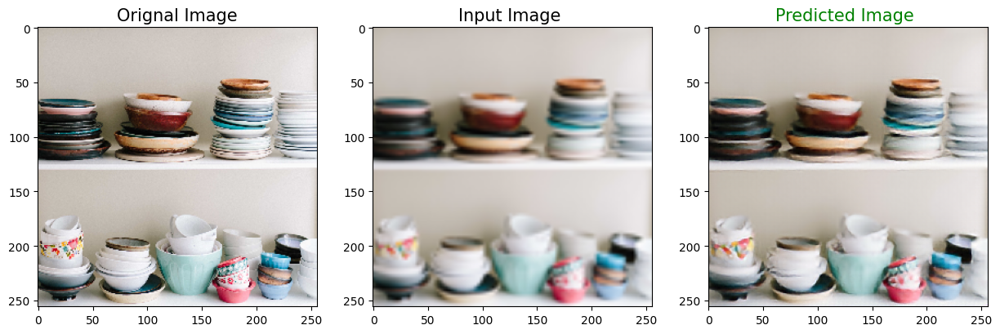

1/1 [==============================] - 0s 29ms/step


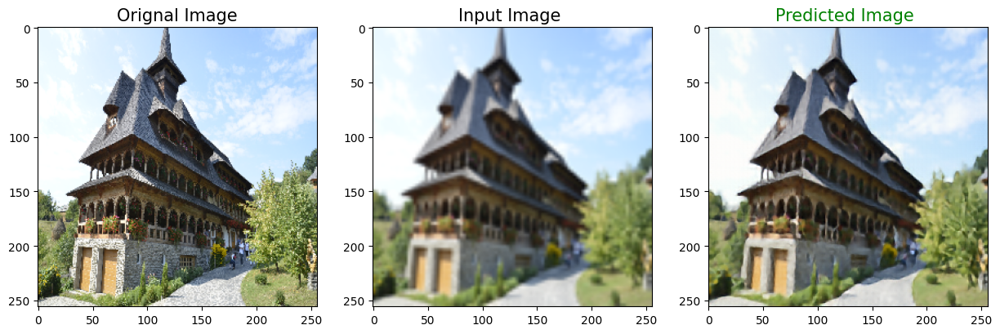

1/1 [==============================] - 0s 32ms/step


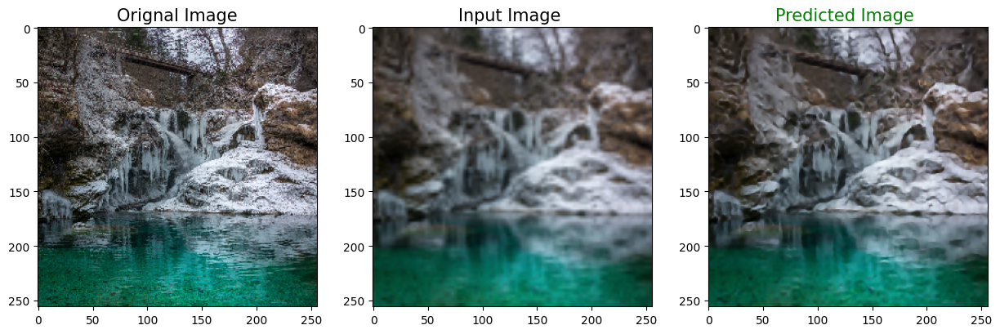

1/1 [==============================] - 0s 27ms/step


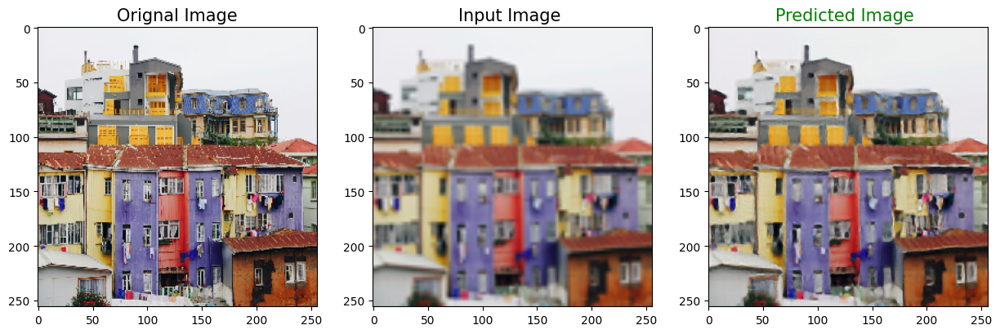

1/1 [==============================] - 0s 33ms/step


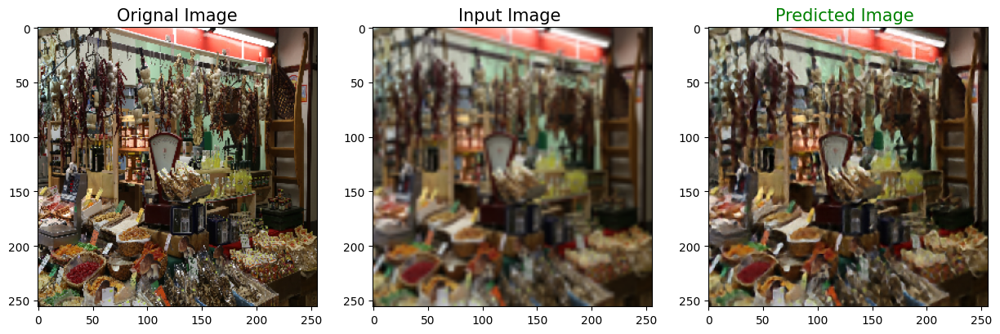

1/1 [==============================] - 0s 29ms/step


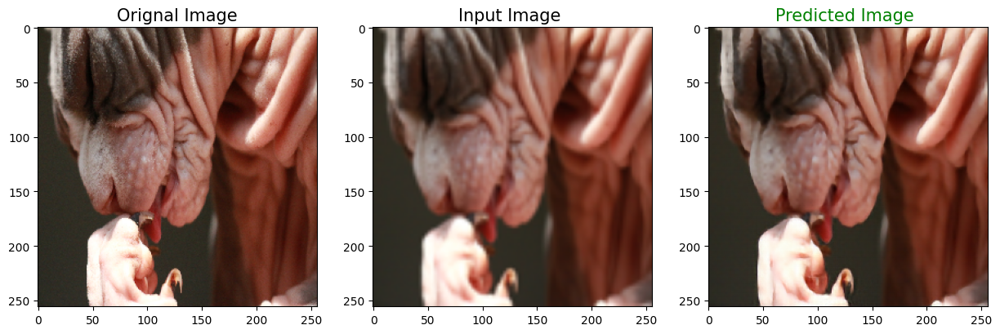

1/1 [==============================] - 0s 26ms/step


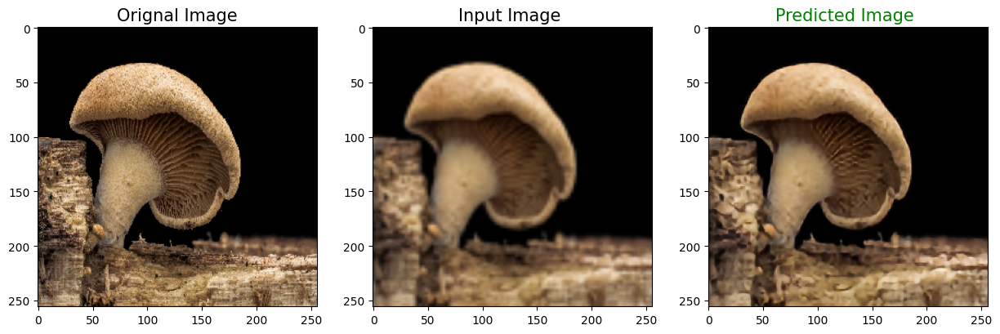

1/1 [==============================] - 0s 43ms/step


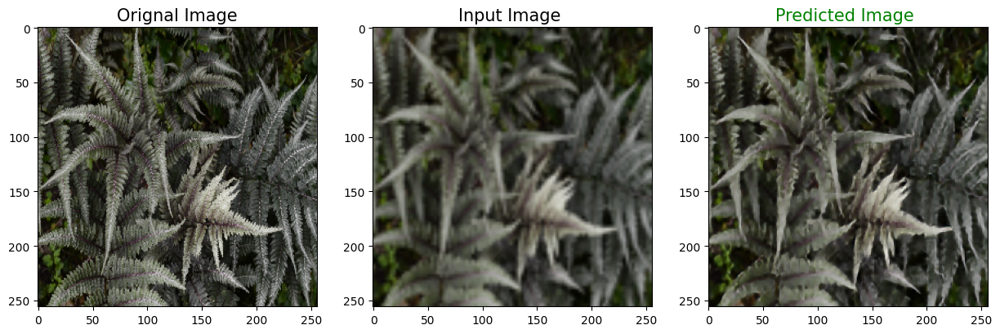

In [ ]:
def plot_images(high,low,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Orignal Image', color = 'black', fontsize = 15)
    plt.imshow(high)
    plt.subplot(1,3,2)
    plt.title('Input Image ', color = 'black', fontsize = 15)
    plt.imshow(low)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Green', fontsize = 15)
    plt.imshow(predicted)

    plt.show()

for i in range(1,10):

    predicted = np.clip(model.predict(test_low_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_high_image[i],test_low_image[i],predicted)

# Saving model

In [ ]:
model.save("model.h5")

## TESTING!

Saving download (10).png to download (10).png
1/1 [==============================] - 0s 287ms/step


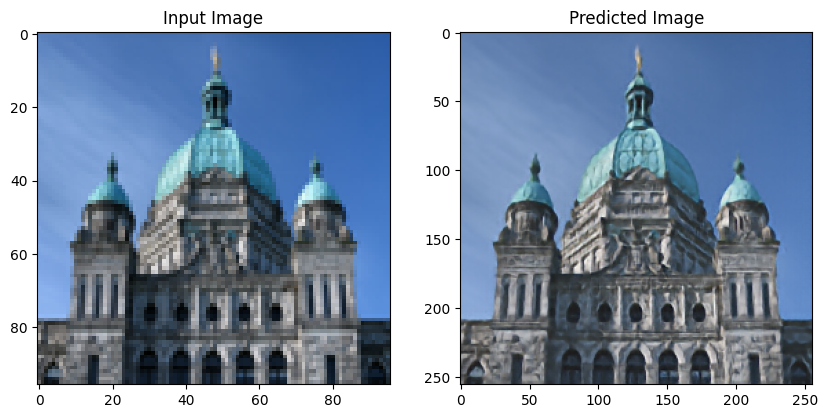

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import files

# Load the model
model = tf.keras.models.load_model('/content/drive/MyDrive/IRDATA/Data/DATA/model.h5')

uploaded = files.upload()
input_image = Image.open(next(iter(uploaded)))

new_size = (256, 256)
input_image_resized = input_image.resize(new_size)

input_array = tf.keras.preprocessing.image.img_to_array(input_image_resized)

input_array = input_array / 255.0

input_array = np.expand_dims(input_array, axis=0)

predicted_array = model.predict(input_array)

predicted_array = predicted_array[0]

predicted_image = tf.keras.preprocessing.image.array_to_img(predicted_array)

fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(input_image)
axs[0].set_title('Input Image')
axs[1].imshow(predicted_image)
axs[1].set_title('Predicted Image')
plt.show()


Saving download (12).png to download (12).png
1/1 [==============================] - 0s 195ms/step


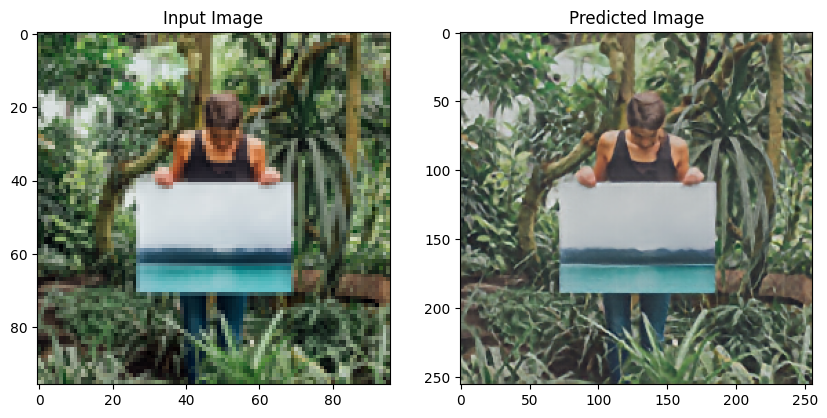

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import files

# Load the model
model = tf.keras.models.load_model('/content/drive/MyDrive/IRDATA/Data/DATA/model.h5')

uploaded = files.upload()
input_image = Image.open(next(iter(uploaded)))

new_size = (256, 256)
input_image_resized = input_image.resize(new_size)

input_array = tf.keras.preprocessing.image.img_to_array(input_image_resized)

input_array = input_array / 255.0

input_array = np.expand_dims(input_array, axis=0)

predicted_array = model.predict(input_array)

predicted_array = predicted_array[0]

predicted_image = tf.keras.preprocessing.image.array_to_img(predicted_array).convert('RGB')

fig, axs = plt.subplots(1, 2, figsize=(10, 10))
axs[0].imshow(input_image)
axs[0].set_title('Input Image')
axs[1].imshow(predicted_image)
axs[1].set_title('Predicted Image')
plt.show()
